In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df_p = pd.read_csv('datasets/70m_p/pile_deduped_70m.csv')
#df_p = df_p.apply(pd.to_numeric, errors='coerce').dropna()

df_m = pd.read_csv('datasets/70m_m/memories_deduped_70m.csv')
#df_m = df_m.apply(pd.to_numeric, errors='coerce').dropna()

memorized entropy_head1_layer1: 50000, pile entropy_head1_layer1: 50000
memorized entropy_head2_layer1: 50000, pile entropy_head2_layer1: 50000
memorized entropy_head3_layer1: 50000, pile entropy_head3_layer1: 50000
memorized entropy_head4_layer1: 50000, pile entropy_head4_layer1: 50000
memorized entropy_head5_layer1: 50000, pile entropy_head5_layer1: 50000
memorized entropy_head6_layer1: 50000, pile entropy_head6_layer1: 50000
memorized entropy_head7_layer1: 50000, pile entropy_head7_layer1: 50000
memorized entropy_head8_layer1: 50000, pile entropy_head8_layer1: 50000
memorized entropy_head1_layer2: 50000, pile entropy_head1_layer2: 50000
memorized entropy_head2_layer2: 50000, pile entropy_head2_layer2: 50000
memorized entropy_head3_layer2: 50000, pile entropy_head3_layer2: 50000
memorized entropy_head4_layer2: 50000, pile entropy_head4_layer2: 50000
memorized entropy_head5_layer2: 50000, pile entropy_head5_layer2: 50000
memorized entropy_head6_layer2: 50000, pile entropy_head6_layer2

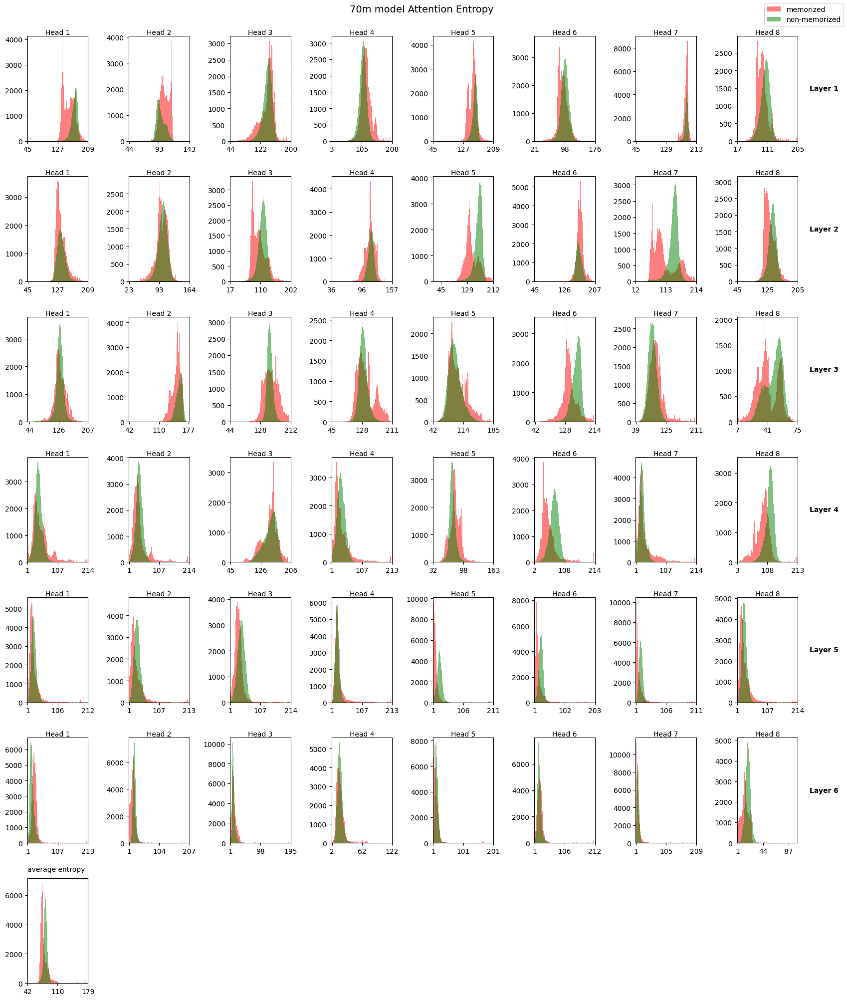

In [1]:
columns_to_drop = ['index', 'avg gini'] + [col for col in df_m.columns if col.startswith('gini')] + [col for col in df_m.columns if col.startswith('head')]
df_mem = df_m.drop(columns=columns_to_drop)
df_pile = df_p.drop(columns=columns_to_drop)
df_mem = df_mem.apply(pd.to_numeric, errors='coerce').dropna()
df_pile = df_pile.apply(pd.to_numeric, errors='coerce').dropna()

num_rows = 7 #need to make this dynamic for different model size 
num_columns = 8

fig, axs = plt.subplots(num_rows, num_columns, figsize=(17, 20))
axs = axs.flatten()

for i, column in enumerate(df_mem.columns):
    x1 = df_mem[column]
    x2 = df_pile[column]
    print(f'memorized {column}: {x1.shape[0]}, pile {column}: {x2.shape[0]}')
    axs[i].hist(x1, bins=100, alpha=0.5, color='red', label='memorized')
    axs[i].hist(x2, bins=100, alpha=0.5, color='green', label='non-memorized')
    axs[i].set_xlim(min(x1.min(), x2.min()), max(x1.max(), x2.max()))
    axs[i].set_xticks([np.ceil(min(x1)), np.ceil(max(x1)), np.ceil((min(x1)+max(x1))/2)])
        
    row_index = i // num_columns
    col_index = i % num_columns
    head_label = 'Head {}'.format(col_index + 1)
        
    if row_index != num_rows - 1:
        if col_index == 0:
            axs[i].annotate(head_label, xy=(0.3, 1), xycoords='axes fraction', ha='left', va='bottom')
        else:
            axs[i].annotate(head_label, xy=(0.5, 1), xycoords='axes fraction', ha='center', va='bottom')

    else: 
        axs[i].annotate('average entropy', xy=(0, 1.05), xycoords='axes fraction', ha='left', va='bottom')

    if (i + 1) % num_columns == 0:
        layer_label = 'Layer {}'.format((i // num_columns) + 1)
        axs[i].annotate(layer_label, xy=(1.2, 0.5), xycoords='axes fraction', ha='left', va='center', weight='bold')

for j in range(i + 1, num_rows * num_columns):
    axs[j].axis('off')

handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.subplots_adjust(hspace=0.5, wspace=0.5, top=1.9)
plt.suptitle('70m model Attention Entropy', y=1.0, fontsize=14) 
fig.tight_layout()
plt.savefig('plots/subplots/entropy.png')
plt.show()

**ANALYSIS OF LOW ENTROPY, HIGH ENTROPY, AND MODE ENTROPY MEMORIZED EXAMPLES**

In [55]:
from datasets import load_dataset
from transformers import AutoTokenizer, AutoModelForCausalLM
import torch 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained("EleutherAI/pythia-70m-deduped")
model = AutoModelForCausalLM.from_pretrained("EleutherAI/pythia-70m-deduped").to(device)
 
dataset_m = load_dataset("EleutherAI/pythia-memorized-evals")
data_m = dataset_m['deduped.70m']
input_ids_m = data_m['tokens']
index_mem = data_m['index']
data_dict_m = {key: value for key, value in zip(index_mem, input_ids_m)}

data_p = load_dataset("EleutherAI/pile-deduped-pythia-random-sampled", split="train[:50000]")
input_ids_p = data_p['tokens']
index_pile = data_p['index']
data_dict_p = {key: value for key, value in zip(index_pile, input_ids_p)}

Found cached dataset parquet (/home/jaydeep/.cache/huggingface/datasets/EleutherAI___parquet/EleutherAI--pythia-memorized-evals-623aaa371a33821a/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec)
100%|██████████| 16/16 [00:08<00:00,  1.94it/s]
Found cached dataset parquet (/home/jaydeep/.cache/huggingface/datasets/EleutherAI___parquet/EleutherAI--pile-deduped-pythia-random-sampled-ef6db9ddd170a4bc/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec)


In [25]:
import csv

xm = df_mem['entropy_head1_layer1']
xp = df_pile['entropy_head1_layer1']

ranges = []
step = 10
for start in range(int(np.floor(xm.min())), int(np.ceil(xm.max())) + 1, step):
    end = min(start + step - 1, int(np.ceil(xm.max())))
    r = (start, end)
    ranges.append(r)
print(ranges)

columns_to_drop = ['avg gini'] + [col for col in df_m.columns if col.startswith('gini')] + [col for col in df_m.columns if col.startswith('head')]
df_mem1 = df_m.drop(columns=columns_to_drop)
df_pile1 = df_p.drop(columns=columns_to_drop)
df_mem1 = df_mem1.apply(pd.to_numeric, errors='coerce').dropna()
df_pile1 = df_pile1.apply(pd.to_numeric, errors='coerce').dropna()

total_m = []
total_p = []

    
for i, (start, end) in enumerate(ranges, 1):
    set_data_m = df_mem1[(xm >= start) & (xm < end+1)]
    index_set_m = set_data_m['index'].tolist()
    with open(f'70mdeduped_analysis/layer1_head1/memorized/{start}-{end}.csv', 'w', newline='') as csvfile:
        writer_m = csv.writer(csvfile)
        writer_m.writerow(['Index', 'Prompt', 'Generation', 'Entropy']) 
        for index_m in set_data_m['index'].tolist():
            tokens_m = data_dict_m[index_m]
            prompt_tokens_m = tokens_m[:32]
            prompt_text_m = tokenizer.decode(prompt_tokens_m, skip_special_tokens=True)
            generation_tokens_m = tokens_m[32:]
            generation_text_m = tokenizer.decode(generation_tokens_m, skip_special_tokens=True)
            if index_m in df_mem1['index'].values:
                entropy_m = df_mem1.loc[df_mem1['index'] == index_m, 'entropy_head1_layer1'].item()
                writer_m.writerow([index_m, prompt_text_m, generation_text_m, entropy_m])
    
    set_data_p = df_pile1[(xp >= start) & (xp < end+1)]
    index_set_p = set_data_p['index'].tolist()
    with open(f'70mdeduped_analysis/layer1_head1/non-memorized/{start}-{end}.csv', 'w', newline='') as csvfile:
        writer_p = csv.writer(csvfile)
        writer_p.writerow(['Index', 'Prompt', 'Generation', 'Entropy']) 
        for index_p in set_data_p['index'].tolist():
            tokens_p = data_dict_p[index_p]
            prompt_tokens_p = tokens_p[:32]
            prompt_text_p = tokenizer.decode(prompt_tokens_p, skip_special_tokens=True)
            generation_tokens_p = tokens_p[32:64]
            generation_text_p = tokenizer.decode(generation_tokens_p, skip_special_tokens=True)
            if index_p in df_pile1['index'].values:
                entropy_p = df_pile1.loc[df_pile1['index'] == index_p, 'entropy_head1_layer1'].item()
                writer_p.writerow([index_p, prompt_text_p, generation_text_p, entropy_p])
    
    print(f"{start}-{end} entropy- memorized: {len(index_set_m)} non-memorized: {len(index_set_p)}")
    total_m.append(len(index_set_m))
    total_p.append(len(index_set_p))
print(f"total memorized: {sum(total_m)} | total non-memorized: {sum(total_p)}")
print(f"total ranges: {len(total_m)}")

44-53 entropy- memorized: 6 non-memorized: 0
54-63 entropy- memorized: 0 non-memorized: 0
64-73 entropy- memorized: 0 non-memorized: 0
74-83 entropy- memorized: 0 non-memorized: 0
84-93 entropy- memorized: 0 non-memorized: 0
94-103 entropy- memorized: 1 non-memorized: 0
104-113 entropy- memorized: 2 non-memorized: 0
114-123 entropy- memorized: 7 non-memorized: 2
124-133 entropy- memorized: 1024 non-memorized: 51
134-143 entropy- memorized: 13865 non-memorized: 251
144-153 entropy- memorized: 8072 non-memorized: 1414
154-163 entropy- memorized: 8871 non-memorized: 5349
164-173 entropy- memorized: 9918 non-memorized: 18659
174-183 entropy- memorized: 5897 non-memorized: 22415
184-193 entropy- memorized: 1798 non-memorized: 1849
194-203 entropy- memorized: 508 non-memorized: 10
204-209 entropy- memorized: 31 non-memorized: 0
total memorized: 50000 | total non-memorized: 50000
total ranges: 17


**HEAT MAPS FOR ATTENTION MATRICES**

In [70]:
index_list_m = [32460854, 114166875, 88599874, 129532524, 72373134, 54287815, 32939030, 11948285, 84609615, 57952552, 45464295, 136536081, 106251555, 103690166, 57893245, 142455492, 114159574, 43261510, 27236900, 19001695, 65289688, 69993438, 124306165, 67966061, 7568380, 61668168, 130538478, 21950334, 87655392, 144998421, 131348642, 101044416, 24180090, 42287382, 79950592, 143006939, 99372070, 140740255, 12928680, 125740173, 136699082, 102080319, 1563489, 137967480]
index_list_pile = [58970, 549798, 1292271, 1004935, 46121, 530548, 907883, 407469, 640416, 1301666, 1125508, 249187, 476527, 1202380, 308528, 1231517, 822318, 575011, 378406, 1096789, 1003440, 330517, 1401740, 1035160, 1004935, 751973, 467642, 914929, 1306178, 208549, 104895, 464876, 39300, 591722, 1078983, 505594, 517091, 850792, 271565, 1026815, 262719, 429119, 1216060, 489599]
index_list_p = [58970, 549798, 1292271, 1004935, 46121, 530548, 907883, 407469, 640416, 1301666, 1125508, 249187, 476527, 1202380, 308528, 1231517, 822318, 575011, 378406, 1096789]


In [71]:
import torch 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

dfm_values = []
dfp_values = []
weights_memorized = [] 
weights_pile = []


for m, p in zip(index_list_m, index_list_p):

    row_index_m = data_m['index'].index(m)
    tokens_m = data_m['tokens'][row_index_m]
    attention_mask_m = [1] * len(tokens_m)
    tokens_m = torch.tensor([tokens_m]).to(device)
    attention_mask_m = torch.tensor([attention_mask_m]).to(device)
    with torch.no_grad():
        outputs_m = model(input_ids=tokens_m, attention_mask=attention_mask_m, output_attentions=True)
    dfm = pd.DataFrame(np.array(outputs_m.attentions[0][0][0].cpu()))
    dfm_values.append(dfm)
    weights_m = np.array(outputs_m.attentions[0][0][0].cpu())
    weights_memorized.append(weights_m) 
     

    row_index_p = data_p['index'].index(p)
    tokens_p = data_p['tokens'][row_index_p]
    tokens_p = tokens_p[:64]
    attention_mask_p = [1] * len(tokens_p)
    tokens_p = torch.tensor([tokens_p]).to(device)
    attention_mask_p = torch.tensor([attention_mask_p]).to(device)
    with torch.no_grad():
        outputs_p = model(input_ids=tokens_p, attention_mask=attention_mask_p, output_attentions=True)
    dfp = pd.DataFrame(np.array(outputs_p.attentions[0][0][0].cpu()))
    dfp_values.append(dfp)
    weights_p = np.array(outputs_p.attentions[0][0][0].cpu())
    weights_pile.append(weights_p)  


frequency_memorized = []
amplitude_memorized = []
frequency_pile = []
amplitude_pile = []
sampling_rate = 50 
 
for weights in weights_memorized:
    freq_m = []
    amp_m = []
    dft_matrix = np.fft.fft2(weights)
    dft_matrix = dft_matrix.flatten() 
    mag = np.abs(dft_matrix)
    for i, (m, sinusoid) in enumerate(zip(mag, dft_matrix)):
        index = np.where(dft_matrix == sinusoid)[0]
        f = (index[0] * (sampling_rate/len(dft_matrix))) 
        freq_m.append(f) 
        amp_m.append(m)
    
    frequency_memorized.append(freq_m)
    amplitude_memorized.append(amp_m)

for weights in weights_pile:
    freq_p = []
    amp_p = []
    dft_matrix = np.fft.fft2(weights)
    dft_matrix = dft_matrix.flatten() 
    mag = np.abs(dft_matrix)
    for i, (m, sinusoid) in enumerate(zip(mag, dft_matrix)):
        index = np.where(dft_matrix == sinusoid)[0]
        f = (index[0] * (sampling_rate/len(dft_matrix))) 
        freq_p.append(f) 
        amp_p.append(m)
    
    frequency_pile.append(freq_p)
    amplitude_pile.append(amp_p)

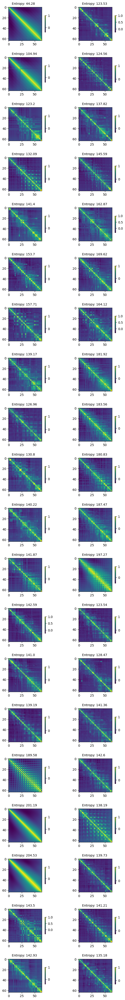

In [72]:
import csv

with open('attention_entropy.csv', 'w', newline='') as csvfile:
    fieldnames = ['Memorized E.', 'Memorized Text', 'Non-memorized E.', 'Non-memorized Text']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writeheader()

    fig, axes = plt.subplots(ncols=2, nrows=len(dfm_values), figsize=(6, 2.2 * len(dfm_values)))

    for i, (df1, df2) in enumerate(zip(dfm_values, dfp_values)):
        ax1, ax2 = axes[i]

        im1 = ax1.imshow(df1.corr())
        im2 = ax2.imshow(df2.corr())

        fig.colorbar(im1, ax=ax1, shrink=0.5)
        fig.colorbar(im2, ax=ax2, shrink=0.5)

        i_m = index_list_m[i]
        entropy_m = float(df_m.loc[df_m['index'] == str(i_m), 'entropy_head1_layer1'].item())
        entropy_m = round(entropy_m, 2)
        memorized_ids = data_dict_m[i_m]
        memorized_text = tokenizer.decode(memorized_ids, skip_special_tokens=True)

        i_p = index_list_p[i]
        entropy_p = float(df_p.loc[df_p['index'] == str(i_p), 'entropy_head1_layer1'].item())
        entropy_p = round(entropy_p, 2)
        pile_ids = data_dict_p[i_p]
        pile_ids = pile_ids[:64]
        pile_text = tokenizer.decode(pile_ids, skip_special_tokens=True)

        text_props = dict(facecolor='white', edgecolor='white', alpha=0.7)
        ax1.text(0.1, 1.1, f'Entropy: {entropy_m}', transform=ax1.transAxes, fontsize=10,
                 verticalalignment='center', horizontalalignment='left', bbox=text_props)
        ax2.text(0.1, 1.1, f'Entropy: {entropy_p}', transform=ax2.transAxes, fontsize=10,
                 verticalalignment='center', horizontalalignment='left', bbox=text_props)

        writer.writerow({'Memorized E.': entropy_m, 'Memorized Text': memorized_text,
                         'Non-memorized E.': entropy_p, 'Non-memorized Text': pile_text})

    fig.tight_layout()
    fig.subplots_adjust(wspace=0.2, hspace=0.5)
    plt.savefig('attention_heatmaps.png')
    plt.show()

In [ ]:
import csv
     
with open('memorized.csv', 'w', newline='') as csvfile:
    fieldnames = ['Memorized E.', 'Memorized Text']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writeheader()

    fig, axes = plt.subplots(ncols=1, nrows=len(index_list_m), figsize=(6, 2.2 * len(index_list_m)))

    for i, df1 in enumerate(dfm_values):
        ax1 = axes[i]

        im1 = ax1.imshow(df1.corr())
         

        fig.colorbar(im1, ax=ax1, shrink=0.5)
        

        i_m = index_list_m[i]
        entropy_m = float(df_m.loc[df_m['index'] == str(i_m), 'entropy_head1_layer1'].item())
        entropy_m = round(entropy_m, 2)
        memorized_ids = data_dict_m[i_m]
        memorized_text = tokenizer.decode(memorized_ids, skip_special_tokens=True)

         

        text_props = dict(facecolor='white', edgecolor='white', alpha=0.7)
        ax1.text(0.1, 1.1, f'Entropy: {entropy_m}', transform=ax1.transAxes, fontsize=10,
                 verticalalignment='center', horizontalalignment='left', bbox=text_props)
         
        writer.writerow({'Memorized E.': entropy_m, 'Memorized Text': memorized_text})

    fig.tight_layout()
    fig.subplots_adjust(wspace=0.2, hspace=0.5)
    plt.savefig('attention_memoried.jpg')
    plt.show()

**Fourier Transform on Attention Matrices** 

In [3]:
import torch 
index_list_m = [32460854, 114166875, 88599874, 129532524, 72373134, 54287815, 32939030, 11948285, 84609615, 57952552, 45464295, 136536081, 106251555, 103690166, 57893245, 27236900, 19001695, 65289688, 69993438, 124306165, 67966061, 7568380, 61668168, 130538478, 21950334, 87655392, 144998421, 131348642, 101044416, 24180090, 42287382, 79950592, 143006939, 99372070, 140740255, 12928680, 125740173, 136699082, 102080319, 1563489, 137967480, 142455492, 114159574, 43261510]
dfm_values = []
fourier_memorized = [] 


for m in index_list_m:

    row_index_m = data_m['index'].index(m)
    tokens_m = data_m['tokens'][row_index_m]
    attention_mask_m = [1] * len(tokens_m)
    tokens_m = torch.tensor([tokens_m])
    attention_mask_m = torch.tensor([attention_mask_m])
    with torch.no_grad():
        outputs_m = model(input_ids=tokens_m, attention_mask=attention_mask_m, output_attentions=True)
    dfm = pd.DataFrame(np.array(outputs_m.attentions[0][0][0]))
    dfm_values.append(dfm)
    weights_m = np.array(outputs_m.attentions[0][0][0])
    fourier_memorized.append(weights_m) 

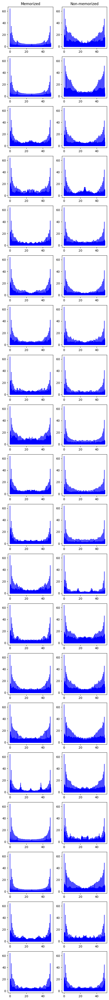

In [84]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(nrows=max(len(frequency_memorized), len(frequency_pile)), ncols=2, figsize=(6, 3*len(frequency_pile)))

# Add titles to the first row only
axs[0, 0].set_title('Memorized')
axs[0, 1].set_title('Non-memorized')

# Plot for the first section (frequency_memorized and amplitude_memorized)
for i, (f, a) in enumerate(zip(frequency_memorized, amplitude_memorized)):
    ax = axs[i, 0]  # Select the left subplot in each row

    for freq, amp in zip(f, a):
        ax.plot([freq, freq], [0, amp], '-', color='blue')

# Plot for the second section (frequency_pile and amplitude_pile)
for i, (f, a) in enumerate(zip(frequency_pile, amplitude_pile)):
    ax = axs[i, 1]  # Select the right subplot in each row

    for freq, amp in zip(f, a):
        ax.plot([freq, freq], [0, amp], '-', color='blue')

plt.show()


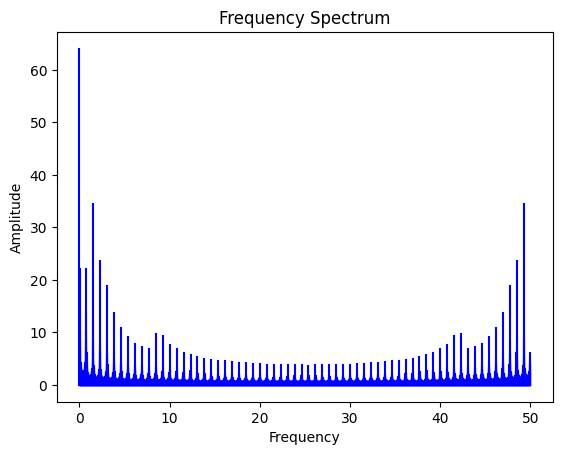

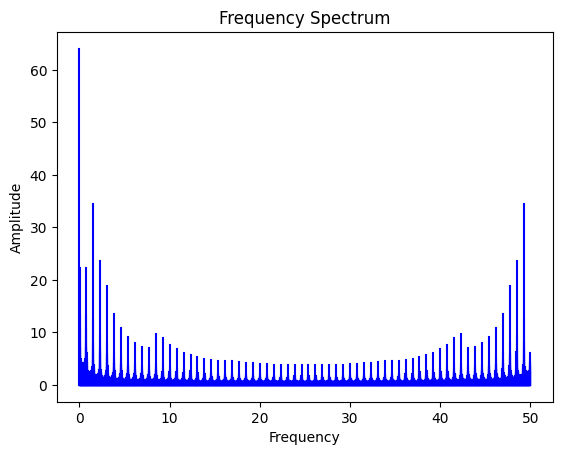

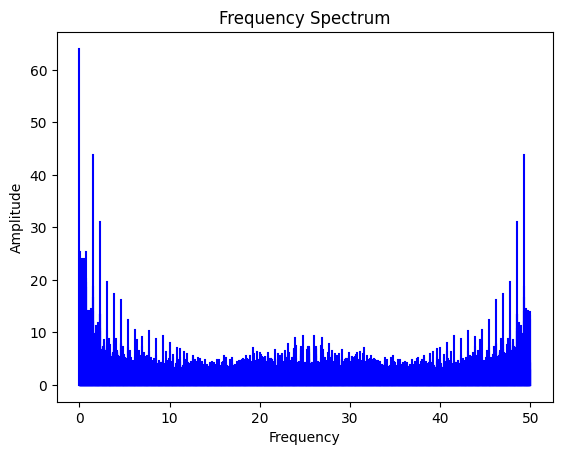

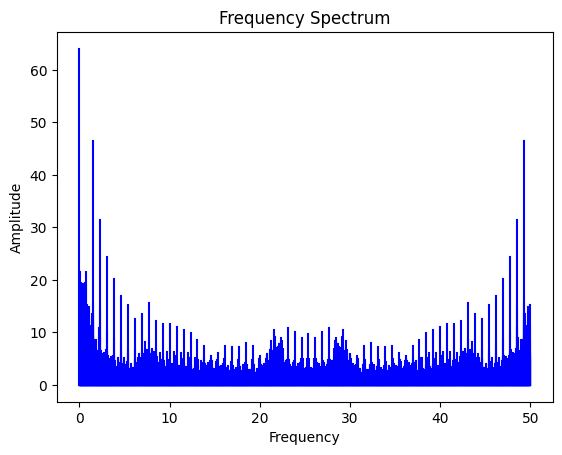

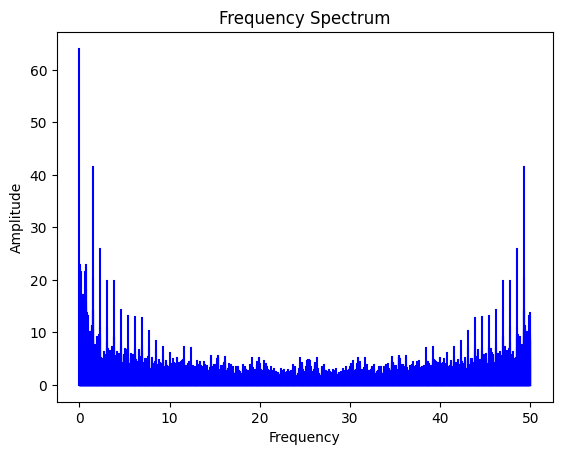

...

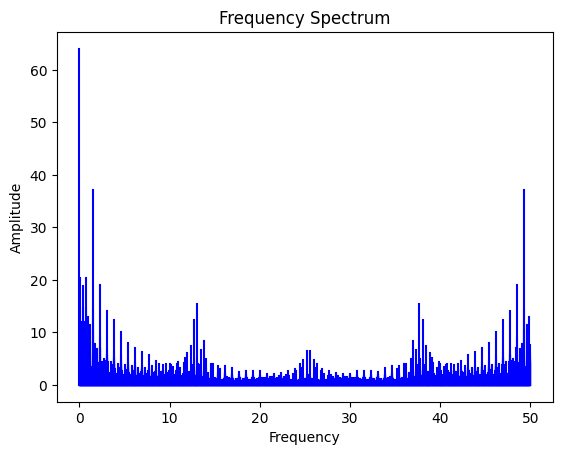

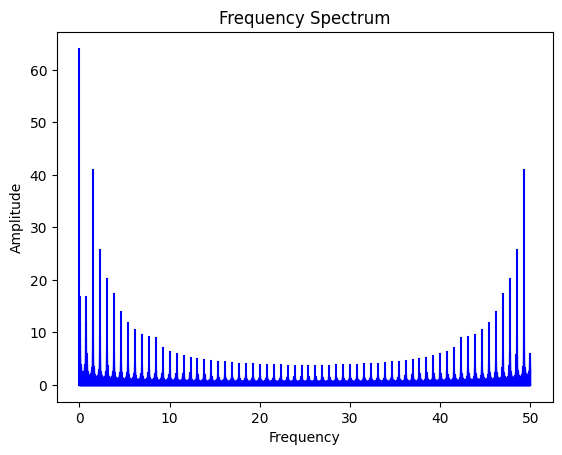

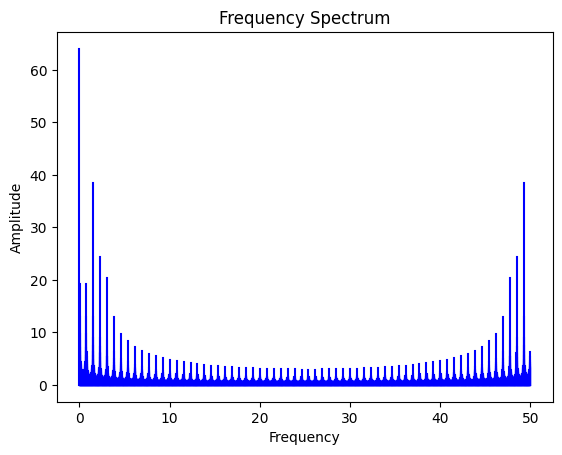

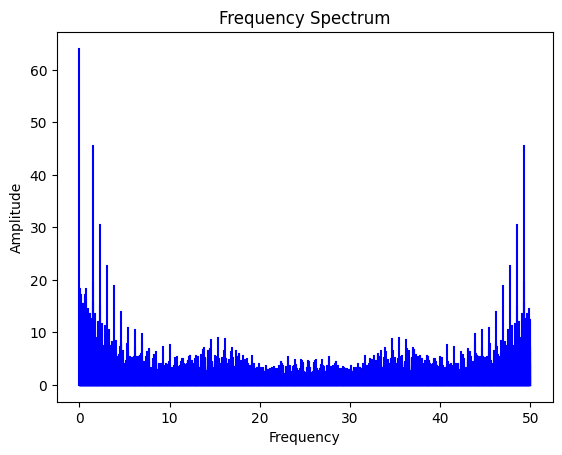

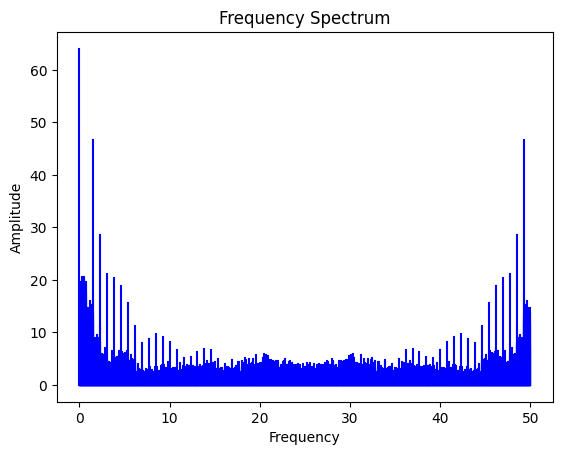

In [79]:
import matplotlib.pyplot as plt

for f, a in zip(frequency_memorized, amplitude_memorized):
    for freq, amp in zip(f, a):
        plt.plot([freq, freq], [0, amp], '-', color='blue')

    plt.xlabel('Frequency')
    plt.ylabel('Amplitude')
    plt.title('Frequency Spectrum')
    plt.show()

for f, a in zip(frequency_pile, amplitude_pile):
    for freq, amp in zip(f, a):
        plt.plot([freq, freq], [0, amp], '-', color='blue')

    plt.xlabel('Frequency')
    plt.ylabel('Amplitude')
    plt.title('Frequency Spectrum')
    plt.show()


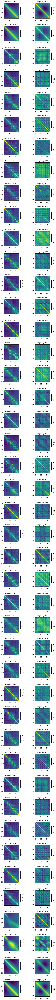

In [81]:
import csv 
with open('memorized.csv', 'w', newline='') as csvfile:
    fieldnames = ['Memorized E.', 'Memorized Text']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writeheader()

    fig, axes = plt.subplots(ncols=2, nrows=len(mag_df), figsize=(6, 2.2 * len(mag_df)))
    for i, (df1, df) in enumerate(zip(dfm_values, mag_df)):
        ax1, ax = axes[i]
        im1 = ax1.imshow(df1.corr())
        im = ax.imshow(df.corr())
        fig.colorbar(im1, ax=ax1, shrink=0.5)
        fig.colorbar(im, ax=ax, shrink=0.5)
        i_m = index_list_m[i]
        entropy_m = float(df_m.loc[df_m['index'] == str(i_m), 'entropy_head1_layer1'].item())
        entropy_m = round(entropy_m, 2)
        memorized_ids = data_dict_m[i_m]
        memorized_text = tokenizer.decode(memorized_ids, skip_special_tokens=True)
        
        text_props = dict(facecolor='white', edgecolor='white', alpha=0.7)
        ax1.text(0.1, 1.1, f'Entropy: {entropy_m}', transform=ax1.transAxes, fontsize=10,
                 verticalalignment='center', horizontalalignment='left', bbox=text_props)
        ax.text(0.1, 1.1, f'Frequency: {round(frequency[i], 2)}', transform=ax.transAxes, fontsize=10,
                 verticalalignment='center', horizontalalignment='left', bbox=text_props)
        
        writer.writerow({'Memorized E.': entropy_m, 'Memorized Text': memorized_text})
    
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.2, hspace=0.5)
    plt.show()

**PERPLEXITY VS ENTROPY GRAPH**

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 

pile = pd.read_csv('datasets/2023-06-14_21-40-48/pile_deduped_70m.csv')
pile = pile.apply(pd.to_numeric, errors='coerce').dropna()
pile = pile.drop(['index'], axis=1)
pile = pile.head(36352)
print(pile.shape[0])
 
mem = pd.read_csv('datasets/2023-06-14_21-33-00/memories_deduped_70m.csv')
mem = mem.apply(pd.to_numeric, errors='coerce').dropna()
mem = mem.drop(['index'], axis=1)
print(mem.shape[0])

36352
36352


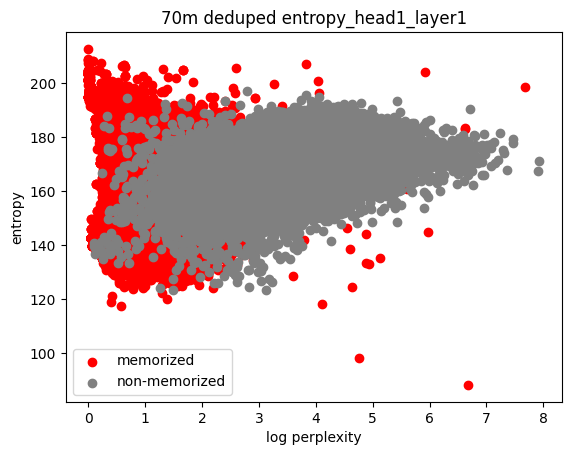

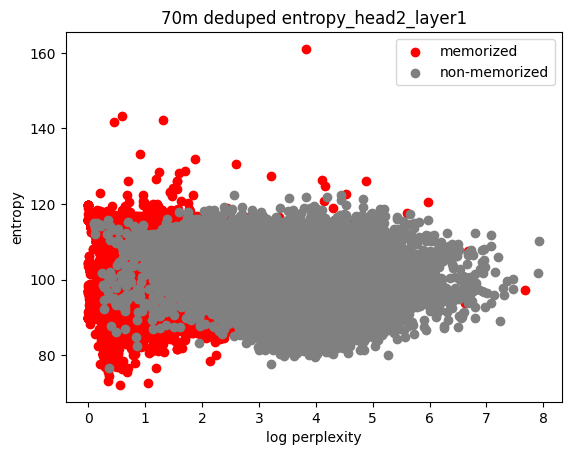

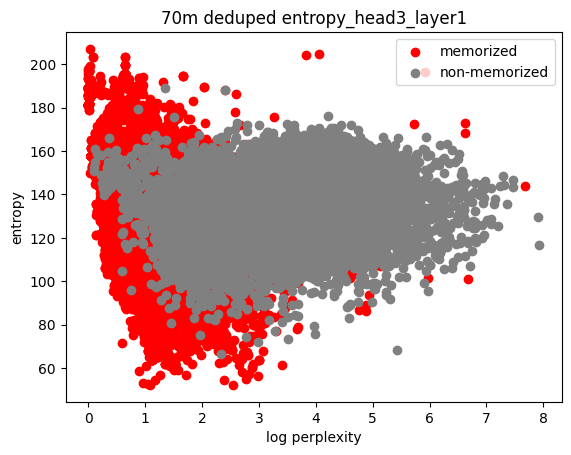

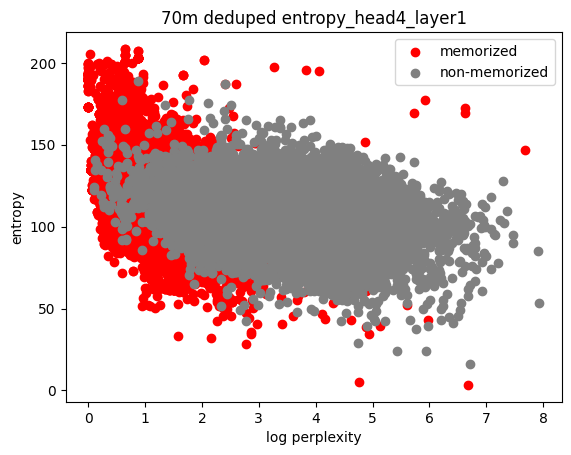

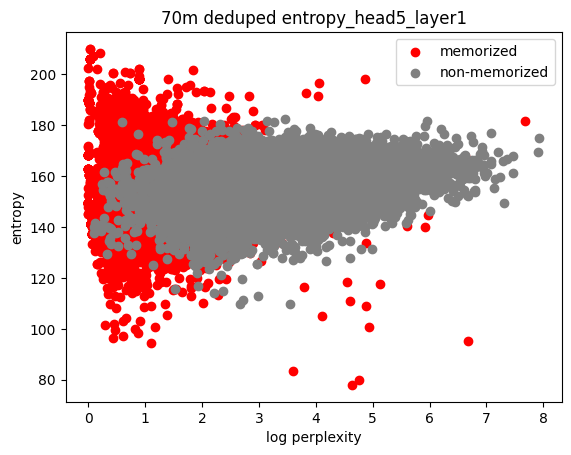

...

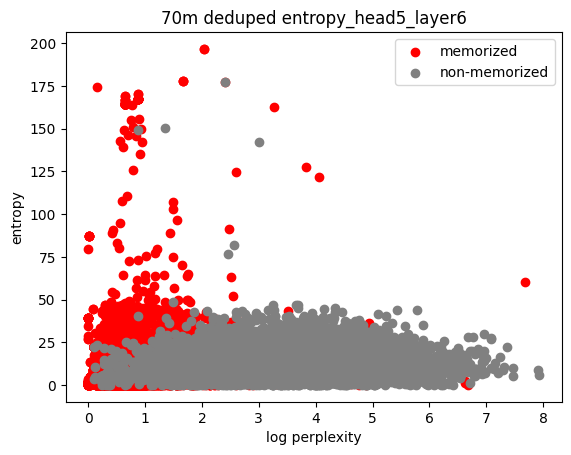

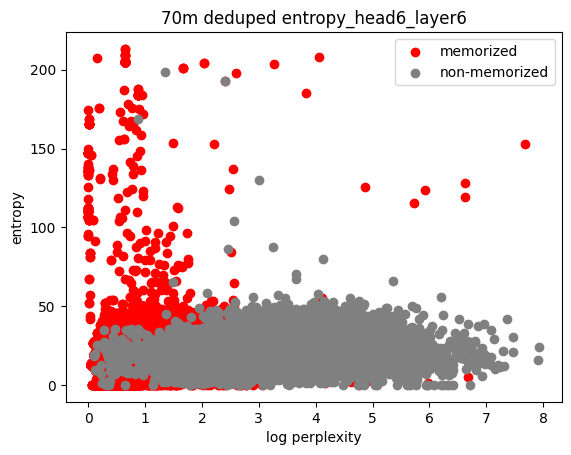

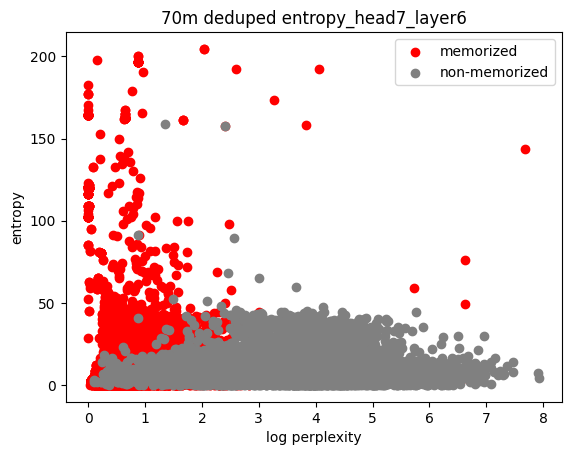

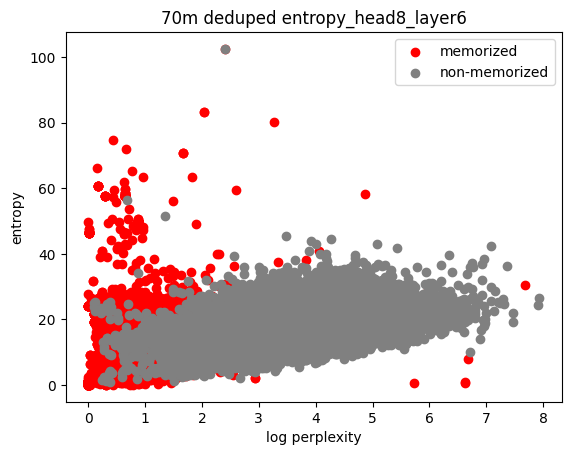

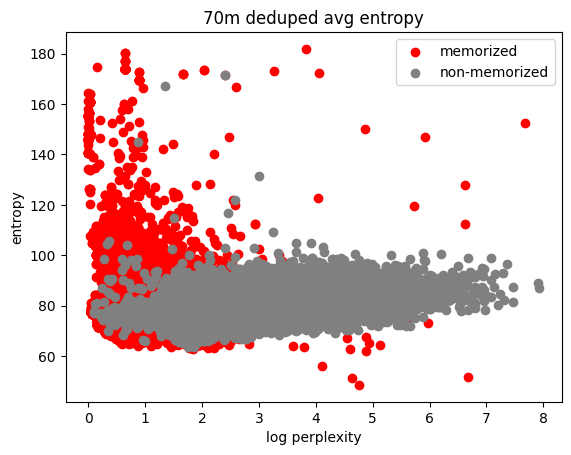

In [19]:
for c in pile: 
    if c == 'sequence_perplexity':
        continue 
    plt.scatter(np.log(mem['sequence_perplexity']), mem[c], c='red', label='memorized')
    plt.scatter(np.log(pile['sequence_perplexity']), pile[c], c='grey', label='non-memorized')
    plt.xlabel('log perplexity')
    plt.ylabel('entropy')
    plt.legend()
    plt.title(f'70m deduped {c}')
    plt.savefig(f'plots/ppl-att/{c}.png')
    plt.show()
